In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/no-tumor-dataset/kaggle/working/preprocessed_images/notumor/Tr-no_0482.jpg
/kaggle/input/no-tumor-dataset/kaggle/working/preprocessed_images/notumor/Tr-no_0641.jpg
/kaggle/input/no-tumor-dataset/kaggle/working/preprocessed_images/notumor/Tr-no_0592.jpg
/kaggle/input/no-tumor-dataset/kaggle/working/preprocessed_images/notumor/Tr-no_0711.jpg
/kaggle/input/no-tumor-dataset/kaggle/working/preprocessed_images/notumor/Tr-no_0746.jpg
/kaggle/input/no-tumor-dataset/kaggle/working/preprocessed_images/notumor/Tr-no_0477.jpg
/kaggle/input/no-tumor-dataset/kaggle/working/preprocessed_images/notumor/Tr-no_0234.jpg
/kaggle/input/no-tumor-dataset/kaggle/working/preprocessed_images/notumor/Tr-no_0953.jpg
/kaggle/input/no-tumor-dataset/kaggle/working/preprocessed_images/notumor/Tr-no_0876.jpg
/kaggle/input/no-tumor-dataset/kaggle/working/preprocessed_images/notumor/Tr-no_0936.jpg
/kaggle/input/no-tumor-dataset/kaggle/working/preprocessed_images/notumor/Tr-no_1240.jpg
/kaggle/input/no-tumo

identifying rare cases of tumor

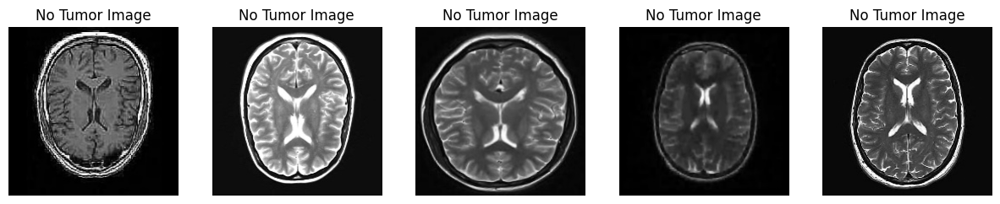

In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to display images
def display_images(images, titles):
    # Ensure the number of images and titles match
    num_images = min(5, len(images), len(titles))

    # Create a figure to display the images
    fig, axes = plt.subplots(1, num_images, figsize=(15, 15))

    # Display each image with its title
    for i in range(num_images):
        axes[i].imshow(images[i], cmap='gray')
        axes[i].axis('off')
        axes[i].set_title(titles[i])

    plt.show()

# Assuming x_test is your test dataset
# Adjust this path based on your actual dataset location
no_tumor_images_path = "/kaggle/input/no-tumor-dataset/kaggle/working/preprocessed_images/notumor"

# Iterate through no tumor images
no_tumor_images = []
for file in os.listdir(no_tumor_images_path):
    image_path = os.path.join(no_tumor_images_path, file)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    no_tumor_images.append(image)

# Set a fixed threshold for demonstration purposes (you might need to adjust this)
threshold_stat = 100

# Identify rare cases based on the threshold
rare_no_tumor_indices = [i for i, image in enumerate(no_tumor_images) if np.mean(image) < threshold_stat]

# Display some of the identified rare cases
num_rare_cases_display = min(5, len(rare_no_tumor_indices))
display_images([no_tumor_images[i] for i in rare_no_tumor_indices],
               ["No Tumor Image"] * num_rare_cases_display)


In [3]:
# Save rare cases to a separate directory
rare_cases_save_path = '/kaggle/working/preprocessed_images/rare_cases1'  # Update with your desired save path

if not os.path.exists(rare_cases_save_path):
    os.makedirs(rare_cases_save_path)

# Iterate through rare cases and save them
for idx in rare_no_tumor_indices:
    file_name = f"rare_case_{idx}.png"
    rare_image = no_tumor_images[idx]
    cv2.imwrite(os.path.join(rare_cases_save_path, file_name), rare_image)


Irregular shape and atypical location

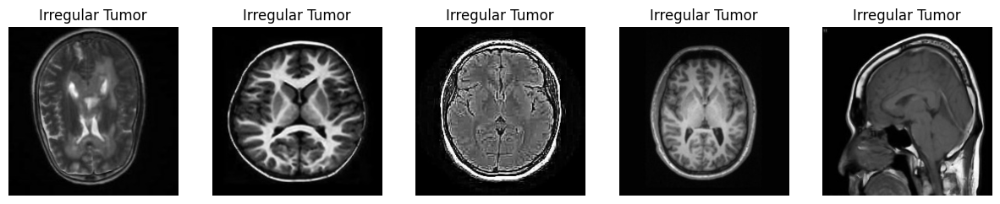

In [4]:
import cv2
import numpy as np
import os

# Function to identify tumors with irregular shape or atypical location
def identify_irregular_tumors(images):
    irregular_tumor_indices = []

    for i, image in enumerate(images):
        # Apply image processing techniques to enhance tumor features
        # You may use edge detection, contour analysis, etc.

        # Example: Use Canny edge detection
        edges = cv2.Canny(image, 50, 150)

        # Find contours in the image
        contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Analyze the contours to identify irregular shape or atypical location
        for contour in contours:
            perimeter = cv2.arcLength(contour, True)
            approx = cv2.approxPolyDP(contour, 0.02 * perimeter, True)

            # Set a threshold for irregularity based on the number of corners
            if len(approx) > 6:
                # This contour has an irregular shape, consider it as a potential rare case
                irregular_tumor_indices.append(i)
                break  # If one irregularity is found, break the loop

    return irregular_tumor_indices

# Assuming you have a list of images in 'rare_cases_images'
# Replace 'your_rare_tumor_path' with the actual path to your dataset
your_rare_tumor_path = '/kaggle/working/preprocessed_images/rare_cases1'
rare_cases_images = []

# Load the images (replace this with your actual loading code)
for file in os.listdir(your_rare_tumor_path):
    image_path = os.path.join(your_rare_tumor_path, file)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    rare_cases_images.append(image)

# Identify tumors with irregular shape or atypical location
irregular_tumor_indices = identify_irregular_tumors(rare_cases_images)

# Display some of the identified irregular tumors
num_irregular_cases_display = min(5, len(irregular_tumor_indices))
display_images([rare_cases_images[i] for i in irregular_tumor_indices],
               ["Irregular Tumor"] * num_irregular_cases_display)


In [5]:
import cv2
import numpy as np
import os

# Function to identify tumors with irregular shape or atypical location
def identify_irregular_tumors(images):
    irregular_tumor_indices = []

    for i, image in enumerate(images):
        # Apply image processing techniques to enhance tumor features
        # You may use edge detection, contour analysis, etc.

        # Example: Use Canny edge detection
        edges = cv2.Canny(image, 50, 150)

        # Find contours in the image
        contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Analyze the contours to identify irregular shape or atypical location
        for contour in contours:
            # Calculate convex hull of the contour
            hull = cv2.convexHull(contour)

            # Calculate the area of the convex hull
            hull_area = cv2.contourArea(hull)

            # Calculate the area of the contour
            contour_area = cv2.contourArea(contour)

            # Avoid division by zero
            if hull_area == 0:
                continue

            # Calculate the solidity (ratio of contour area to convex hull area)
            solidity = float(contour_area) / hull_area

            # Set a threshold for solidity to identify potential irregular shapes
            solidity_threshold = 0.8  # Adjust as needed

            if solidity < solidity_threshold:
                # This contour has an irregular shape, consider it as a potential rare case
                irregular_tumor_indices.append(i)
                break  # If one irregularity is found, break the loop

    return irregular_tumor_indices

# Save images to files
def save_images(images, titles, save_path='./'):
    for image, title in zip(images, titles):
        cv2.imwrite(os.path.join(save_path, f"{title}.png"), image)

# Assuming you have a list of images in 'rare_cases_images'
# Replace 'your_rare_tumor_path' with the actual path to your dataset
your_rare_tumor_path = '/kaggle/working/preprocessed_images/rare_cases1'
rare_cases_images = []

# Load the images (replace this with your actual loading code)
for file in os.listdir(your_rare_tumor_path):
    image_path = os.path.join(your_rare_tumor_path, file)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    rare_cases_images.append(image)

# Identify tumors with irregular shape or atypical location
irregular_tumor_indices = identify_irregular_tumors(rare_cases_images)

# Print indices of identified irregular tumors
print("Indices of Irregular Tumors:", irregular_tumor_indices)

# Save some of the identified irregular tumors to files
num_irregular_cases_save = min(5, len(irregular_tumor_indices))
save_images([rare_cases_images[i] for i in irregular_tumor_indices],
            ["Irregular_Tumor_" + str(i) for i in range(num_irregular_cases_save)],
            save_path='/kaggle/working/output_images/')





Indices of Irregular Tumors: [1, 2, 4, 5, 6, 7, 8, 9, 10, 12, 15, 16, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 33, 35, 36, 38, 39, 40, 41, 42, 43, 44, 47, 48, 49, 50, 55, 56, 58, 61, 62, 63, 64, 65, 66, 67, 68, 70, 71, 74, 75, 76, 77, 78, 80, 83, 86, 87, 88, 89, 92, 93, 94, 96, 97, 98, 99, 101, 102, 103, 105, 107, 108, 109, 110, 111, 112, 113, 114, 116, 118, 119, 121, 122, 123, 124, 125, 126, 129, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 142, 143, 144, 145, 146, 149, 150, 151, 153, 155, 156, 157, 158, 159, 162, 163, 164, 165, 166, 168, 169, 171, 174, 175, 176, 177, 179, 180, 182, 184, 185, 186, 187, 188, 190, 191, 192, 193, 194, 195, 196, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 212, 213, 214, 215, 216, 218, 220, 221, 223, 224, 225, 226, 227, 229, 231, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 254, 255, 256, 257, 258, 259, 260, 261, 262, 264, 265, 266, 268, 269, 270, 271, 272, 273, 274, 275, 276, 278, 2

Specific Enhancement patterns

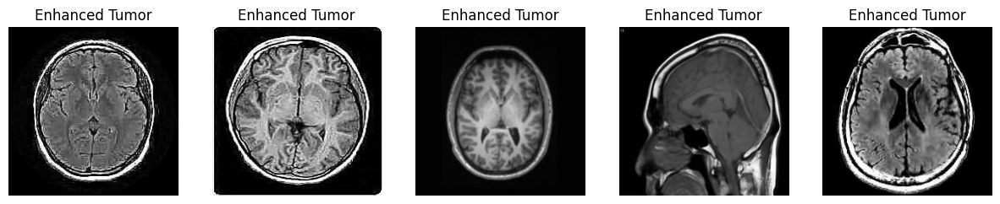

In [6]:

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to display images
def display_images(images, titles):
    # Ensure the number of images and titles match
    num_images = min(5, len(images), len(titles))

    # Create a figure to display the images
    fig, axes = plt.subplots(1, num_images, figsize=(15, 15))

    # Display each image with its title
    for i in range(num_images):
        axes[i].imshow(images[i], cmap='gray')
        axes[i].axis('off')
        axes[i].set_title(titles[i])

    plt.show()

# Function to identify tumors with specific enhancement patterns
def identify_enhancement_patterns(images):
    enhanced_tumor_indices = []

    for i, file in enumerate(os.listdir(images)):
        # Read the image
        image_path = os.path.join(images, file)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        # Apply image processing techniques to enhance tumor features
        # You may use contrast enhancement, filtering, etc.

        # Example: Use histogram equalization for contrast enhancement
        equalized_image = cv2.equalizeHist(image)

        # Apply a filter to enhance specific patterns (e.g., heterogeneous enhancement, ring enhancement, central necrosis)
        # Example: Apply a Laplacian filter
        laplacian = cv2.Laplacian(equalized_image, cv2.CV_64F)

        # Set a threshold for enhanced patterns
        threshold = 500  # Adjust as needed
        if np.sum(laplacian > threshold) > 0:
            # This image has enhanced patterns, consider it as a potential rare case
            enhanced_tumor_indices.append(file)

    return enhanced_tumor_indices

# Assuming you have a path to your dataset in 'rare_cases_images'
# Identify tumors with specific enhancement patterns
enhanced_tumor_indices = identify_enhancement_patterns('/kaggle/working/preprocessed_images/rare_cases1')

# Display some of the identified tumors with enhancement patterns
num_enhanced_cases_display = min(5, len(enhanced_tumor_indices))
display_images([cv2.imread(os.path.join('/kaggle/working/preprocessed_images/rare_cases1', i), cv2.IMREAD_GRAYSCALE) for i in enhanced_tumor_indices],
               ["Enhanced Tumor"] * num_enhanced_cases_display)


       

In [7]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to identify tumors with specific enhancement patterns
def identify_enhancement_patterns(images_path):
    enhanced_tumor_indices = []

    for i, file in enumerate(os.listdir(images_path)):
        # Read the image
        image_path = os.path.join(images_path, file)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        # Apply image processing techniques to enhance tumor features
        # You may use contrast enhancement, filtering, etc.

        # Example: Use histogram equalization for contrast enhancement
        equalized_image = cv2.equalizeHist(image)

        # Apply a filter to enhance specific patterns (e.g., heterogeneous enhancement, ring enhancement, central necrosis)
        # Example: Apply a Laplacian filter
        laplacian = cv2.Laplacian(equalized_image, cv2.CV_64F)

        # Set a threshold for enhanced patterns
        threshold = 500  # Adjust as needed
        if np.sum(laplacian > threshold) > 0:
            # This image has enhanced patterns, consider it as a potential rare case
            enhanced_tumor_indices.append(i)

    return enhanced_tumor_indices

# Assuming you have a path to your dataset in 'rare_cases_images'
# Identify tumors with specific enhancement patterns
enhanced_tumor_indices = identify_enhancement_patterns('/kaggle/working/preprocessed_images/rare_cases1')

# Display the list of indices with enhanced patterns
print("Indices of Enhanced Tumors:", enhanced_tumor_indices)





Indices of Enhanced Tumors: [2, 3, 4, 5, 6, 7, 8, 9, 13, 15, 16, 17, 19, 20, 22, 24, 25, 26, 32, 33, 42, 43, 45, 46, 49, 51, 52, 53, 55, 56, 64, 65, 70, 73, 74, 75, 77, 80, 81, 84, 86, 87, 91, 94, 96, 97, 98, 99, 102, 103, 104, 105, 107, 108, 110, 112, 119, 126, 129, 131, 135, 136, 137, 139, 140, 144, 146, 147, 148, 154, 156, 159, 161, 162, 163, 164, 171, 173, 174, 176, 177, 178, 179, 181, 183, 185, 187, 193, 197, 200, 201, 202, 205, 209, 210, 213, 215, 220, 221, 222, 223, 225, 226, 227, 228, 229, 231, 235, 236, 238, 239, 240, 241, 243, 248, 252, 253, 254, 255, 256, 257, 259, 261, 262, 263, 266, 267, 269, 270, 273, 274, 279, 282, 284, 286, 287, 291, 292, 296, 297, 300, 301, 302, 306, 309, 313, 314, 316, 319, 321, 322, 324, 326, 327, 328, 331, 333, 334, 336, 339, 340, 341, 342, 343, 344, 345, 348, 351, 352, 355, 358, 360, 363, 366, 368, 369, 375, 377, 378, 381, 384, 385, 387, 388, 390, 393, 394, 395, 396, 398, 403, 404, 406, 409, 411, 415, 418, 419, 424, 428, 436, 437, 438, 444, 447, 45

Calcification

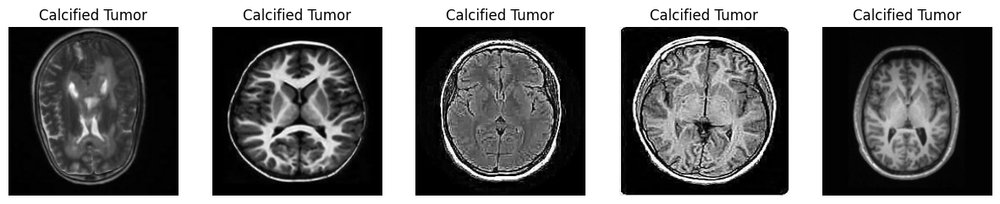

In [8]:
# Function to identify tumors with calcifications
def identify_calcifications(images):
    calcified_tumor_indices = []

    for i, file in enumerate(os.listdir(images)):
        # Read the image
        image_path = os.path.join(images, file)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        # Apply image processing techniques to identify calcifications
        # You may use filters, thresholding, etc.

        # Example: Apply a filter to enhance calcifications (adjust parameters as needed)
        calcification_filter = cv2.Canny(image, 30, 100)

        # Set a threshold for calcifications
        threshold = 1000  # Adjust as needed
        if np.sum(calcification_filter > 0) > threshold:
            # This image has calcifications, consider it as a potential rare case
            calcified_tumor_indices.append(file)

    return calcified_tumor_indices

# Assuming you have a path to your dataset in 'rare_cases_images'
# Identify tumors with calcifications
calcified_tumor_indices = identify_calcifications('/kaggle/working/preprocessed_images/rare_cases1')

# Display some of the identified tumors with calcifications
num_calcified_cases_display = min(5, len(calcified_tumor_indices))
display_images([cv2.imread(os.path.join('/kaggle/working/preprocessed_images/rare_cases1', i), cv2.IMREAD_GRAYSCALE) for i in calcified_tumor_indices],
               ["Calcified Tumor"] * num_calcified_cases_display)



In [9]:

import os
import cv2
import numpy as np

# Function to identify tumors with calcifications
def identify_calcifications(images_path):
    calcified_tumor_indices = []

    for i, file in enumerate(os.listdir(images_path)):
        # Read the image
        image_path = os.path.join(images_path, file)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        # Apply image processing techniques to identify calcifications
        # Example: Use adaptive thresholding
        _, thresh = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Find contours in the binary image
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Analyze the contours to identify potential calcifications
        for contour in contours:
            area = cv2.contourArea(contour)
            perimeter = cv2.arcLength(contour, True)

            # Avoid division by zero
            if perimeter == 0:
                continue

            # Calculate circularity
            circularity = (4 * np.pi * area) / (perimeter * perimeter)

            # Set a threshold for circularity to identify potential calcifications
            circularity_threshold = 0.5  # Adjust as needed based on the characteristics of your dataset

            if circularity > circularity_threshold:
                # This contour has sufficient circularity, consider it as a potential calcification
                calcified_tumor_indices.append(i)
                break  # If one potential calcification is found, break the loop

    return calcified_tumor_indices

# Assuming you have a path to your dataset in 'rare_cases_images'
# Identify tumors with calcifications
calcified_tumor_indices = identify_calcifications('/kaggle/working/preprocessed_images/rare_cases1')

# Print the list of indices with calcifications
print("Indices of Calcified Tumors:", calcified_tumor_indices)


  

Indices of Calcified Tumors: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 127, 128, 129, 130, 131, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 218, 219, 220, 221, 222, 223, 224, 225,

Cystic Components

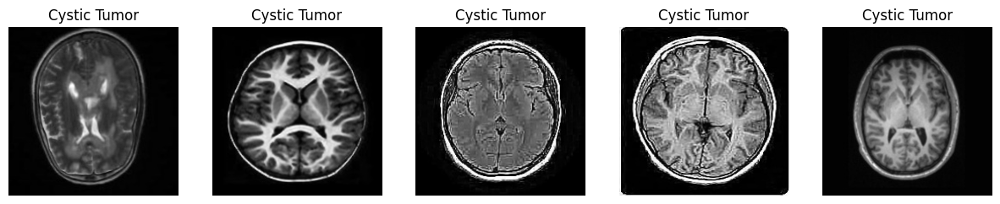

In [10]:
# Function to identify tumors with cystic components
def identify_cystic_components(images):
    cystic_tumor_indices = []

    for i, file in enumerate(os.listdir(images)):
        # Read the image
        image_path = os.path.join(images, file)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        # Apply image processing techniques to identify cystic components
        # You may use segmentation, intensity thresholding, etc.

        # Example: Use Otsu's thresholding for binary segmentation
        _, binary_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Set a threshold for cystic components (adjust as needed)
        cystic_threshold = 0.01 * np.prod(image.shape)  # Adjust as needed
        if np.sum(binary_image > 0) > cystic_threshold:
            # This image has cystic components, consider it as a potential rare case
            cystic_tumor_indices.append(file)

    return cystic_tumor_indices

# Assuming you have a path to your dataset in 'rare_cases_images'
# Identify tumors with cystic components
cystic_tumor_indices = identify_cystic_components('/kaggle/working/preprocessed_images/rare_cases1')

# Display some of the identified tumors with cystic components
num_cystic_cases_display = min(5, len(cystic_tumor_indices))
display_images([cv2.imread(os.path.join('/kaggle/working/preprocessed_images/rare_cases1', i), cv2.IMREAD_GRAYSCALE) for i in cystic_tumor_indices],
               ["Cystic Tumor"] * num_cystic_cases_display)



In [11]:
import os
import cv2
import numpy as np

# Function to identify tumors with cystic components
def identify_cystic_components(images_path):
    cystic_tumor_indices = []

    # Get the list of image files in the directory
    image_files = [file for file in os.listdir(images_path)]

    for i, file in enumerate(image_files):
        # Read the image
        image_path = os.path.join(images_path, file)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        # Apply Gaussian blur to reduce noise
        blurred_image = cv2.GaussianBlur(image, (5, 5), 0)

        # Reshape the image to a 1D array for clustering
        reshaped_image = blurred_image.reshape((-1, 1))

        # Use K-means clustering to identify cystic components
        k = 2  # Number of clusters (background and cystic regions)
        criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
        _, labels, centers = cv2.kmeans(reshaped_image.astype(np.float32), k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

        # Reshape the labels to match the original image shape
        labels = labels.reshape(blurred_image.shape)

        # Extract the cystic component based on the label
        cystic_component = np.where(labels == 1, 255, 0).astype(np.uint8)

        # Set a threshold for the percentage of cystic pixels (adjust as needed)
        cystic_percentage_threshold = 0.5  # Adjust as needed

        if np.sum(cystic_component > 0) > cystic_percentage_threshold * np.prod(image.shape):
            # This image has a sufficient percentage of cystic components
            cystic_tumor_indices.append(i)

    return cystic_tumor_indices

# Assuming you have a path to your dataset in 'rare_cases_images'
# Identify tumors with cystic components
cystic_tumor_indices = identify_cystic_components('/kaggle/working/preprocessed_images/rare_cases1')

# Print the list of indices with cystic components
print("Indices of Cystic Tumors:", cystic_tumor_indices)



Indices of Cystic Tumors: [2, 3, 4, 5, 11, 12, 14, 18, 21, 28, 29, 31, 33, 34, 35, 37, 39, 40, 41, 44, 47, 50, 51, 52, 54, 55, 58, 59, 61, 62, 64, 66, 68, 73, 75, 77, 81, 83, 84, 85, 86, 87, 90, 91, 94, 95, 96, 98, 102, 103, 108, 113, 114, 115, 116, 117, 118, 120, 126, 127, 129, 131, 136, 137, 139, 140, 141, 144, 146, 147, 151, 152, 154, 155, 156, 157, 162, 163, 164, 166, 168, 169, 170, 171, 172, 173, 174, 176, 177, 178, 182, 183, 186, 187, 188, 189, 191, 196, 197, 198, 200, 203, 205, 206, 208, 209, 211, 213, 216, 220, 223, 225, 226, 229, 232, 234, 235, 237, 240, 241, 242, 244, 245, 246, 247, 249, 250, 252, 254, 255, 256, 259, 260, 261, 263, 264, 265, 267, 269, 270, 275, 276, 277, 279, 282, 284, 286, 290, 296, 298, 299, 300, 302, 303, 307, 309, 312, 313, 314, 315, 316, 317, 319, 321, 322, 324, 325, 326, 328, 331, 332, 335, 339, 342, 343, 344, 345, 349, 352, 353, 354, 359, 362, 364, 367, 368, 370, 371, 372, 373, 375, 377, 378, 380, 386, 389, 391, 393, 398, 399, 401, 402, 403, 406, 408, 

Hemorrhage or Necrosis

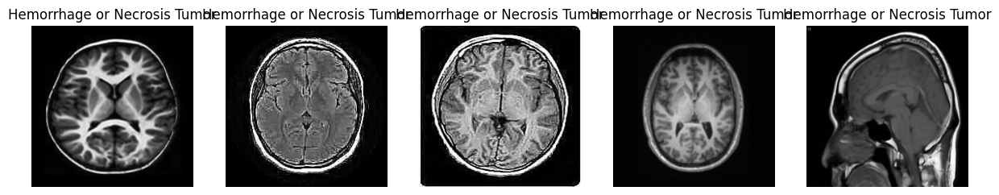

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to identify tumors with hemorrhage or necrosis
def identify_hemorrhage_necrosis(images):
    hemorrhage_necrosis_indices = []

    for i, file in enumerate(images):
        # Read the image in grayscale
        image = cv2.imread(file, cv2.IMREAD_GRAYSCALE)

        # Apply image processing techniques to identify hemorrhage or necrosis
        # You may use color thresholding, texture analysis, etc.

        # Example: Use intensity thresholding to identify hemorrhagic regions
        # Define intensity threshold for considering an image as having hemorrhage or necrosis
        threshold_intensity = 150

        # Count the number of pixels with intensity above the threshold
        intense_pixel_count = np.sum(image > threshold_intensity)

        # Threshold for considering an image as having hemorrhage or necrosis
        threshold_count = 1000

        if intense_pixel_count > threshold_count:
            hemorrhage_necrosis_indices.append(i)

    return hemorrhage_necrosis_indices

# Path to the rare cases of tumor dataset
rare_cases_images_path = '/kaggle/working/preprocessed_images/rare_cases1'

# Get the list of image files in the directory
rare_cases_images = [os.path.join(rare_cases_images_path, file) for file in os.listdir(rare_cases_images_path)]

# Identify tumors with hemorrhage or necrosis
hemorrhage_necrosis_indices = identify_hemorrhage_necrosis(rare_cases_images)

# Display some of the identified tumors with hemorrhage or necrosis
num_hemorrhage_necrosis_display = min(5, len(hemorrhage_necrosis_indices))
display_images([cv2.imread(rare_cases_images[i], cv2.IMREAD_GRAYSCALE) for i in hemorrhage_necrosis_indices],
               ["Hemorrhage or Necrosis Tumor"] * num_hemorrhage_necrosis_display)




In [13]:

import cv2
import numpy as np

# Function to identify tumors with hemorrhage or necrosis
def identify_hemorrhage_necrosis(images):
    hemorrhage_necrosis_indices = []

    for i, file in enumerate(images):
        # Read the image in grayscale
        image = cv2.imread(file, cv2.IMREAD_GRAYSCALE)

        # Apply image processing techniques to identify hemorrhage or necrosis
        # You may use color thresholding, texture analysis, etc.

        # Example: Use intensity thresholding to identify hemorrhagic regions
        # Define intensity threshold for considering an image as having hemorrhage or necrosis
        threshold_intensity = 150

        # Count the number of pixels with intensity above the threshold
        intense_pixel_count = np.sum(image > threshold_intensity)

        # Threshold for considering an image as having hemorrhage or necrosis
        threshold_count = 1000

        if intense_pixel_count > threshold_count:
            hemorrhage_necrosis_indices.append(i)

    return hemorrhage_necrosis_indices

# Path to the rare cases of tumor dataset
rare_cases_images_path = '/kaggle/working/preprocessed_images/rare_cases1'

# Get the list of image files in the directory
rare_cases_images = [os.path.join(rare_cases_images_path, file) for file in os.listdir(rare_cases_images_path)]

# Identify tumors with hemorrhage or necrosis
hemorrhage_necrosis_indices = identify_hemorrhage_necrosis(rare_cases_images)

# Print the list of indices with hemorrhage or necrosis
print("Indices of Tumors with Hemorrhage or Necrosis:", hemorrhage_necrosis_indices)




Indices of Tumors with Hemorrhage or Necrosis: [1, 2, 3, 4, 5, 6, 8, 9, 10, 13, 14, 15, 17, 18, 19, 20, 22, 23, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 37, 38, 40, 41, 42, 43, 46, 47, 48, 49, 51, 52, 56, 57, 58, 59, 60, 61, 62, 64, 65, 66, 67, 68, 70, 71, 72, 73, 75, 76, 77, 78, 80, 81, 82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 94, 96, 97, 98, 99, 101, 102, 103, 104, 105, 106, 108, 109, 110, 111, 112, 114, 116, 119, 121, 124, 126, 127, 129, 130, 131, 134, 135, 137, 138, 139, 143, 145, 146, 147, 148, 149, 155, 156, 157, 158, 159, 161, 162, 163, 164, 165, 168, 169, 170, 171, 172, 173, 174, 176, 177, 178, 182, 183, 185, 186, 187, 188, 189, 190, 191, 193, 194, 195, 196, 198, 199, 200, 201, 202, 203, 204, 205, 206, 208, 209, 210, 211, 213, 214, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 227, 228, 229, 230, 231, 233, 234, 235, 236, 238, 240, 241, 242, 243, 244, 245, 247, 248, 252, 253, 254, 255, 257, 259, 260, 261, 262, 263, 266, 267, 268, 269, 270, 271, 272, 273, 274, 276, 278, 279

In [14]:
def common_indices(*lists):
    if not lists:
        return []

    # Find common elements in the first list
    common_elements = set(lists[0])

    # Intersect with common elements of the remaining lists
    for l in lists[1:]:
        common_elements = common_elements.intersection(set(l))

    # Find indices of common elements in each list
    result = [i for i, e in enumerate(lists[0]) if e in common_elements]

    return result

# Example usage:

# Example usage:
Irregular_Tumors=[0, 3, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 17, 18, 20, 21, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 38, 39, 40, 42, 43, 45, 46, 47, 50, 52, 53, 55, 56, 57, 58, 59, 63, 64, 65, 67, 68, 70, 71, 73, 75, 76, 77, 78, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 101, 103, 104, 105, 106, 107, 108, 109, 110, 113, 115, 117, 120, 121, 122, 124, 125, 127, 128, 131, 133, 134, 135, 136, 137, 138, 139, 140, 141, 143, 145, 146, 148, 149, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 181, 183, 185, 187, 188, 189, 190, 191, 194, 195, 197, 199, 200, 201, 202, 204, 205, 206, 208, 212, 213, 214, 215, 219, 221, 222, 223, 224, 225, 227, 228, 229, 230, 231, 232, 233, 234, 237, 238, 239, 240, 241, 242, 244, 245, 246, 247, 248, 251, 252, 253, 256, 257, 258, 259, 260, 262, 263, 264, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 279, 280, 282, 283, 284, 285, 286, 287, 288, 289, 292, 296, 298, 300, 301, 302, 305, 307, 308, 309, 311, 312, 314, 317, 319, 321, 323, 324, 326, 328, 329, 330, 331, 332, 333, 334, 335, 338, 339, 340, 341, 342, 343, 346, 347, 349, 350, 351, 352, 353, 354, 356, 357, 358, 360, 361, 362, 363, 365, 366, 367, 368, 369, 370, 371, 373, 374, 376, 377, 379, 380, 382, 383, 384, 385, 387, 388, 389, 390, 391, 392, 393, 396, 398, 399, 401, 403, 404, 405, 407, 408, 409, 410, 413, 414, 416, 417, 418, 419, 420, 421, 422, 425, 426, 427, 429, 430, 431, 433, 434, 436, 438, 439, 440, 441, 443, 445, 446, 447, 449, 450, 451, 453, 454, 455, 457, 458, 459, 461, 462, 463, 465, 466, 467, 469, 471, 472, 473, 474, 476, 478, 480, 482, 483, 484, 485, 486, 487, 488, 490, 491, 492, 496, 497, 498, 501, 502, 503, 504, 505, 506, 507, 509, 510, 511, 512, 514, 515, 516, 517, 518, 519, 520, 523, 524, 525, 526, 527, 528, 529, 530, 531, 532, 534, 535, 536, 538, 539, 540, 542, 543, 546, 547, 548, 549, 550, 553, 554, 556, 557, 558, 559, 561, 562, 563, 564, 565, 566, 567, 569, 572, 573, 574, 575, 576, 577, 578, 579, 580, 582, 584, 586, 587, 589, 590, 591, 592, 594, 595, 596, 597, 598, 600, 601, 602, 603, 604, 605, 606, 608, 610, 611, 612, 615, 616, 617, 618, 619, 620, 621, 622, 623, 624, 625, 626, 628, 629, 630, 631, 632, 634, 637, 643, 644, 645, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 658, 659, 660, 661, 662, 663, 665, 667, 668, 669, 670, 671, 672, 673, 675, 677, 678, 679, 680, 682, 683, 684, 685, 686, 687, 688, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 705, 706, 707, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 725, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 743, 744, 745, 746, 747, 749, 752, 753, 755, 756, 757, 760, 761, 763, 766, 767, 769, 770, 771, 772, 773, 774, 775, 776, 777, 779, 781, 782, 784, 786, 787, 788, 789, 791, 792, 794, 798, 799, 800, 801, 802, 803, 804, 805, 807, 809, 810, 813, 814, 816, 817, 822, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 836, 837, 838, 839, 840, 841, 843, 844, 845, 846, 848, 849, 853, 855, 856, 857, 858, 860, 861, 863, 865, 866, 867, 868, 869, 870, 871, 872, 873, 874, 875, 876, 879, 880, 881, 883, 884, 885, 887, 888, 890, 891, 892, 894, 895, 896, 897, 898, 899, 900, 901, 902, 903, 907, 908, 909, 910, 911, 913, 914, 915, 916, 918, 922, 925, 926, 927, 928, 929, 930, 931, 932, 933, 934, 936, 937, 938, 939, 940, 941, 942, 943, 944, 947, 948, 949, 950, 951, 952, 953, 954, 955, 956, 957, 958, 959, 960, 961, 963, 965, 966, 967, 968, 970, 971, 972, 976, 978, 979, 980, 981, 982, 983, 985, 987, 988, 990, 991, 992, 993, 994, 995, 997, 998, 999, 1000, 1001, 1003, 1004, 1005, 1008, 1009, 1010, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1021, 1023, 1024, 1026, 1030, 1032, 1033, 1034, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1044, 1045, 1046, 1047, 1048, 1050, 1052, 1053, 1054, 1055, 1056, 1057, 1058, 1059, 1060, 1061, 1062, 1064, 1065, 1066, 1067, 1068, 1069, 1070, 1071, 1072, 1073, 1074, 1075, 1077, 1078, 1079, 1080, 1081, 1082, 1084, 1085, 1086, 1087, 1088, 1090, 1092, 1093, 1095, 1096, 1098, 1099, 1100, 1101, 1102, 1103, 1104, 1105, 1106, 1108, 1109, 1110, 1111, 1112, 1113, 1114, 1117, 1118, 1119, 1121, 1123, 1124, 1125, 1126, 1127, 1128, 1130, 1131, 1132, 1133, 1135, 1136, 1138, 1139, 1140, 1142, 1143, 1144, 1145, 1147, 1148, 1149, 1151, 1153, 1154, 1155, 1156, 1157, 1159, 1160, 1161, 1162, 1163, 1164, 1165, 1166, 1169, 1170, 1171, 1172, 1174, 1176, 1178, 1181, 1182, 1184, 1185, 1186, 1187, 1192, 1193, 1194, 1195, 1197, 1198, 1199, 1201, 1202, 1203, 1204, 1205, 1206, 1207, 1208, 1209, 1210, 1211, 1212, 1215, 1216, 1217, 1219, 1220, 1221, 1222, 1223, 1224, 1225, 1227, 1229, 1230, 1231, 1232, 1233, 1236, 1237, 1238, 1240, 1241, 1242, 1243, 1244, 1245, 1246, 1247, 1249, 1251, 1252, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1262, 1263, 1264, 1265, 1267, 1268, 1269, 1270, 1271, 1272, 1273, 1276, 1277, 1278, 1279, 1282, 1283, 1284, 1286, 1287, 1288, 1289, 1291, 1292, 1293, 1294, 1295, 1296, 1297, 1298, 1301, 1302, 1303, 1304, 1305, 1306, 1307, 1308, 1309, 1312, 1313, 1315, 1316, 1318, 1319, 1320, 1321, 1322, 1323, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333, 1334, 1335, 1337, 1338, 1339, 1340, 1341, 1342, 1343, 1344, 1345, 1347, 1349, 1351, 1353, 1354, 1355, 1356, 1357, 1358, 1359, 1360, 1361, 1362, 1364, 1365, 1366, 1368, 1371, 1374, 1375, 1376, 1377, 1378, 1379, 1381, 1382, 1383, 1384, 1385, 1386, 1387, 1388, 1390, 1392, 1393, 1394, 1395, 1396, 1397, 1398, 1399, 1400, 1401, 1402, 1403, 1404, 1405, 1406, 1409, 1410, 1411, 1412, 1413, 1414, 1416, 1417, 1418, 1419, 1420, 1422, 1423, 1424, 1425, 1426, 1427, 1428, 1429, 1430, 1431, 1432, 1433, 1434, 1435, 1437, 1438, 1439, 1440, 1441, 1442, 1444, 1445, 1446, 1448, 1450, 1451, 1454, 1455, 1456, 1459, 1460, 1461, 1463, 1464, 1465, 1466, 1467, 1469, 1470, 1471, 1472, 1474, 1476, 1477, 1478, 1479, 1481, 1483, 1484, 1485, 1486, 1487, 1488, 1489, 1490, 1491, 1492, 1493, 1494, 1495, 1496, 1497, 1498, 1499, 1500, 1501, 1502, 1504, 1505, 1507, 1510, 1511, 1512, 1513, 1516, 1517, 1519, 1520, 1522, 1523, 1525, 1526, 1527, 1528, 1530, 1531, 1532, 1533, 1534, 1535, 1536, 1537, 1538, 1539]

Enhanced_Tumors= [2, 3, 5, 7, 9, 11, 14, 16, 18, 19, 22, 24, 28, 29, 32, 36, 39, 42, 43, 48, 49, 53, 54, 55, 57, 60, 61, 67, 68, 69, 75, 76, 77, 81, 83, 84, 87, 93, 95, 96, 97, 98, 100, 101, 104, 107, 110, 112, 117, 121, 122, 124, 125, 127, 131, 135, 136, 137, 141, 143, 146, 148, 150, 152, 155, 156, 157, 158, 160, 163, 166, 167, 168, 169, 173, 174, 176, 178, 179, 183, 184, 185, 186, 187, 191, 193, 197, 200, 204, 205, 206, 211, 212, 214, 215, 217, 227, 229, 230, 239, 242, 244, 246, 247, 248, 250, 253, 254, 255, 257, 258, 261, 265, 267, 271, 272, 276, 278, 279, 284, 285, 289, 290, 291, 292, 296, 298, 300, 304, 306, 307, 310, 314, 316, 317, 318, 319, 326, 327, 328, 330, 332, 333, 334, 339, 340, 341, 343, 346, 347, 350, 354, 357, 358, 359, 364, 365, 367, 368, 370, 371, 373, 378, 383, 385, 387, 389, 391, 393, 396, 398, 401, 404, 405, 407, 408, 413, 414, 415, 417, 419, 420, 427, 429, 431, 433, 434, 436, 438, 439, 440, 441, 444, 445, 446, 451, 452, 454, 456, 458, 461, 462, 463, 465, 466, 467, 469, 471, 474, 478, 479, 481, 485, 486, 488, 489, 493, 497, 498, 500, 501, 503, 504, 505, 506, 507, 508, 512, 514, 515, 518, 519, 520, 521, 522, 524, 525, 527, 528, 530, 531, 536, 539, 540, 543, 547, 548, 552, 553, 559, 560, 562, 565, 572, 574, 575, 580, 586, 590, 591, 594, 596, 598, 601, 602, 605, 608, 612, 614, 617, 618, 620, 625, 626, 627, 628, 631, 633, 646, 647, 649, 651, 652, 654, 656, 662, 663, 665, 668, 669, 670, 672, 674, 678, 680, 681, 690, 694, 696, 697, 698, 701, 702, 703, 704, 705, 706, 707, 709, 711, 713, 714, 717, 718, 719, 721, 722, 723, 724, 725, 728, 729, 730, 731, 732, 733, 734, 736, 737, 738, 744, 745, 746, 749, 751, 752, 755, 759, 760, 762, 763, 764, 767, 768, 771, 774, 777, 778, 779, 780, 781, 786, 787, 790, 791, 794, 799, 801, 803, 804, 805, 806, 807, 809, 814, 816, 817, 818, 822, 825, 826, 828, 830, 832, 835, 837, 838, 840, 841, 842, 844, 845, 851, 853, 855, 859, 861, 862, 866, 868, 869, 870, 873, 876, 879, 881, 883, 887, 895, 897, 898, 903, 906, 907, 908, 912, 917, 924, 925, 928, 931, 936, 938, 939, 944, 945, 949, 950, 951, 953, 956, 957, 960, 961, 965, 966, 967, 971, 974, 977, 979, 980, 982, 987, 990, 992, 995, 996, 999, 1002, 1004, 1005, 1010, 1011, 1013, 1015, 1016, 1018, 1019, 1023, 1026, 1027, 1029, 1032, 1037, 1040, 1046, 1048, 1051, 1055, 1056, 1059, 1062, 1064, 1066, 1067, 1068, 1070, 1077, 1080, 1085, 1087, 1088, 1089, 1093, 1095, 1097, 1100, 1101, 1103, 1104, 1107, 1110, 1111, 1117, 1120, 1128, 1136, 1140, 1141, 1143, 1146, 1148, 1149, 1150, 1154, 1156, 1159, 1160, 1161, 1163, 1168, 1169, 1171, 1172, 1174, 1175, 1177, 1180, 1183, 1187, 1190, 1195, 1196, 1197, 1199, 1200, 1201, 1203, 1204, 1206, 1207, 1208, 1211, 1216, 1218, 1219, 1220, 1222, 1224, 1225, 1229, 1230, 1231, 1235, 1237, 1238, 1239, 1241, 1242, 1245, 1246, 1249, 1250, 1251, 1253, 1256, 1257, 1258, 1263, 1264, 1266, 1271, 1273, 1274, 1282, 1283, 1284, 1285, 1290, 1292, 1293, 1294, 1297, 1299, 1307, 1309, 1310, 1315, 1317, 1319, 1321, 1322, 1328, 1330, 1333, 1334, 1335, 1337, 1338, 1343, 1344, 1345, 1347, 1352, 1355, 1357, 1359, 1361, 1363, 1364, 1365, 1366, 1367, 1369, 1371, 1375, 1377, 1379, 1384, 1385, 1387, 1388, 1390, 1393, 1396, 1402, 1404, 1408, 1410, 1415, 1417, 1418, 1419, 1428, 1429, 1430, 1434, 1438, 1440, 1443, 1444, 1445, 1446, 1450, 1452, 1455, 1456, 1459, 1460, 1461, 1463, 1464, 1465, 1466, 1469, 1471, 1474, 1478, 1480, 1482, 1483, 1491, 1492, 1493, 1495, 1497, 1498, 1502, 1504, 1505, 1506, 1508, 1509, 1513, 1514, 1515, 1516, 1517, 1521, 1522, 1523, 1525, 1528, 1530, 1531, 1533, 1534]

Calcified_Tumors= [0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 69, 70, 71, 72, 73, 74, 76, 77, 78, 79, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 94, 95, 96, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 157, 158, 159, 160, 161, 162, 164, 166, 167, 168, 169, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 227, 228, 229, 231, 232, 233, 234, 235, 236, 237, 238, 240, 241, 242, 243, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 260, 261, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 278, 279, 280, 281, 282, 283, 285, 286, 287, 288, 289, 290, 291, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 313, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 346, 347, 348, 350, 351, 352, 353, 355, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 472, 473, 475, 476, 477, 478, 479, 480, 481, 482, 483, 484, 485, 486, 487, 489, 490, 491, 492, 493, 494, 495, 496, 497, 498, 499, 500, 502, 503, 504, 505, 506, 507, 508, 509, 510, 511, 513, 514, 515, 516, 517, 518, 519, 520, 522, 523, 524, 525, 526, 527, 528, 529, 530, 531, 533, 534, 535, 536, 537, 538, 539, 540, 541, 542, 543, 544, 545, 546, 547, 548, 549, 550, 551, 552, 554, 555, 556, 557, 558, 559, 560, 561, 563, 564, 565, 566, 567, 568, 569, 570, 571, 572, 573, 574, 575, 576, 577, 578, 579, 580, 581, 582, 583, 584, 585, 586, 587, 588, 590, 591, 592, 593, 594, 595, 596, 597, 598, 599, 600, 601, 602, 603, 604, 605, 606, 607, 608, 609, 610, 611, 612, 613, 614, 615, 616, 617, 618, 619, 620, 621, 622, 623, 624, 625, 626, 627, 628, 629, 630, 631, 632, 633, 634, 636, 637, 638, 639, 640, 641, 642, 644, 645, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 656, 657, 658, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 695, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775, 776, 777, 778, 779, 780, 781, 782, 783, 784, 786, 787, 789, 790, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 832, 833, 834, 835, 836, 837, 838, 839, 840, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 853, 854, 855, 856, 857, 858, 859, 860, 861, 862, 863, 864, 865, 866, 867, 868, 869, 870, 871, 872, 873, 874, 875, 876, 877, 878, 879, 881, 882, 883, 884, 885, 886, 887, 888, 889, 890, 891, 892, 893, 894, 895, 896, 897, 898, 899, 900, 901, 902, 903, 904, 905, 906, 907, 908, 909, 910, 911, 912, 913, 914, 915, 916, 917, 918, 919, 920, 921, 923, 924, 925, 926, 927, 928, 929, 930, 931, 932, 933, 934, 935, 936, 937, 938, 939, 940, 941, 942, 943, 944, 945, 946, 947, 948, 949, 950, 951, 952, 953, 954, 955, 956, 957, 958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983, 984, 985, 987, 988, 989, 990, 991, 992, 993, 994, 995, 996, 997, 999, 1000, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1010, 1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1023, 1024, 1025, 1027, 1028, 1029, 1030, 1031, 1032, 1033, 1034, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1044, 1045, 1047, 1048, 1049, 1050, 1051, 1053, 1054, 1056, 1057, 1058, 1059, 1060, 1061, 1062, 1063, 1064, 1065, 1066, 1067, 1068, 1069, 1070, 1071, 1072, 1073, 1074, 1075, 1076, 1077, 1078, 1079, 1080, 1082, 1083, 1084, 1085, 1086, 1087, 1088, 1089, 1090, 1091, 1092, 1093, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1104, 1105, 1106, 1107, 1108, 1109, 1110, 1111, 1112, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1125, 1126, 1127, 1128, 1129, 1130, 1131, 1132, 1133, 1134, 1135, 1137, 1138, 1139, 1140, 1141, 1142, 1143, 1144, 1145, 1146, 1147, 1148, 1149, 1150, 1151, 1152, 1153, 1154, 1155, 1157, 1158, 1160, 1161, 1162, 1163, 1164, 1165, 1166, 1167, 1168, 1169, 1170, 1171, 1173, 1175, 1176, 1177, 1178, 1179, 1180, 1181, 1182, 1183, 1184, 1185, 1186, 1187, 1188, 1189, 1190, 1191, 1192, 1193, 1194, 1195, 1196, 1197, 1198, 1199, 1200, 1201, 1202, 1203, 1204, 1205, 1206, 1207, 1209, 1210, 1211, 1212, 1213, 1215, 1216, 1217, 1218, 1219, 1220, 1221, 1223, 1224, 1225, 1226, 1227, 1228, 1229, 1230, 1231, 1232, 1233, 1235, 1236, 1237, 1238, 1239, 1240, 1241, 1242, 1243, 1244, 1245, 1247, 1248, 1249, 1250, 1251, 1252, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1270, 1271, 1272, 1273, 1274, 1275, 1276, 1277, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1286, 1287, 1288, 1289, 1290, 1291, 1292, 1293, 1294, 1295, 1296, 1297, 1298, 1299, 1300, 1301, 1302, 1303, 1304, 1305, 1306, 1307, 1308, 1309, 1310, 1311, 1312, 1313, 1314, 1315, 1316, 1318, 1319, 1320, 1321, 1322, 1323, 1324, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333, 1334, 1335, 1336, 1337, 1338, 1339, 1340, 1341, 1342, 1343, 1344, 1345, 1346, 1347, 1348, 1349, 1350, 1351, 1352, 1353, 1354, 1355, 1357, 1358, 1359, 1360, 1361, 1362, 1363, 1364, 1365, 1366, 1367, 1368, 1369, 1370, 1371, 1372, 1373, 1374, 1375, 1376, 1377, 1378, 1379, 1380, 1381, 1382, 1383, 1384, 1385, 1386, 1387, 1388, 1389, 1390, 1391, 1392, 1393, 1394, 1395, 1396, 1397, 1398, 1400, 1401, 1402, 1403, 1404, 1405, 1406, 1407, 1408, 1409, 1410, 1411, 1412, 1413, 1414, 1415, 1417, 1418, 1419, 1420, 1421, 1422, 1423, 1424, 1425, 1426, 1427, 1428, 1429, 1430, 1431, 1432, 1433, 1434, 1435, 1436, 1437, 1438, 1439, 1440, 1441, 1442, 1443, 1445, 1447, 1448, 1449, 1450, 1451, 1452, 1453, 1454, 1455, 1456, 1457, 1458, 1459, 1460, 1461, 1462, 1463, 1464, 1466, 1468, 1469, 1470, 1471, 1472, 1473, 1474, 1475, 1476, 1477, 1478, 1479, 1480, 1481, 1482, 1484, 1485, 1486, 1487, 1488, 1489, 1490, 1492, 1493, 1494, 1495, 1496, 1497, 1498, 1499, 1500, 1501, 1502, 1503, 1504, 1505, 1507, 1508, 1509, 1510, 1511, 1512, 1513, 1514, 1515, 1516, 1517, 1518, 1519, 1520, 1521, 1522, 1523, 1524, 1525, 1526, 1527, 1528, 1529, 1530, 1531, 1532, 1533, 1534, 1535, 1536, 1537, 1538, 1539]

Cystic_Tumors= [1, 2, 3, 4, 7, 8, 10, 12, 19, 20, 24, 25, 29, 30, 31, 33, 35, 36, 37, 38, 40, 41, 43, 44, 45, 51, 52, 54, 55, 57, 58, 60, 61, 64, 67, 70, 71, 73, 74, 77, 80, 81, 83, 84, 87, 88, 89, 90, 93, 94, 95, 96, 98, 100, 103, 106, 115, 116, 118, 120, 123, 126, 129, 131, 132, 133, 136, 137, 140, 142, 144, 145, 146, 147, 149, 150, 152, 154, 155, 157, 160, 162, 166, 168, 171, 173, 175, 178, 179, 181, 183, 185, 186, 187, 188, 190, 194, 197, 203, 204, 205, 206, 209, 211, 213, 214, 215, 217, 218, 220, 221, 225, 226, 228, 229, 231, 233, 235, 237, 239, 240, 241, 245, 246, 247, 251, 255, 257, 258, 260, 262, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 277, 279, 280, 281, 286, 289, 291, 292, 294, 295, 297, 298, 300, 302, 305, 307, 308, 311, 313, 318, 325, 327, 328, 329, 336, 338, 341, 342, 343, 344, 345, 349, 353, 354, 357, 358, 361, 362, 363, 367, 368, 369, 372, 374, 375, 377, 379, 380, 389, 391, 392, 393, 394, 398, 400, 401, 403, 404, 405, 406, 407, 408, 410, 411, 415, 416, 417, 425, 429, 431, 433, 439, 440, 442, 443, 447, 448, 450, 454, 455, 459, 460, 461, 462, 463, 464, 466, 467, 470, 476, 480, 481, 483, 484, 489, 490, 494, 495, 496, 497, 500, 502, 504, 508, 509, 510, 511, 516, 521, 522, 523, 525, 529, 531, 536, 537, 543, 544, 545, 552, 554, 555, 556, 557, 560, 561, 562, 563, 568, 569, 570, 573, 574, 575, 576, 577, 579, 580, 581, 582, 584, 586, 589, 590, 591, 592, 595, 596, 597, 599, 601, 602, 603, 605, 606, 610, 611, 612, 614, 615, 617, 618, 620, 621, 622, 623, 627, 628, 631, 632, 633, 635, 636, 638, 639, 640, 641, 645, 646, 647, 649, 650, 651, 655, 656, 657, 660, 662, 663, 666, 667, 668, 669, 670, 671, 672, 674, 675, 676, 677, 678, 679, 685, 687, 689, 691, 692, 695, 701, 703, 706, 708, 709, 710, 711, 713, 715, 717, 720, 721, 723, 725, 730, 737, 740, 741, 743, 744, 746, 748, 749, 754, 756, 757, 762, 763, 765, 766, 771, 773, 774, 775, 776, 779, 782, 784, 786, 787, 789, 790, 792, 798, 799, 800, 801, 804, 805, 806, 809, 810, 812, 813, 814, 822, 823, 827, 828, 829, 831, 835, 838, 839, 842, 845, 848, 849, 851, 852, 853, 856, 857, 858, 859, 860, 862, 863, 864, 866, 868, 869, 872, 874, 875, 876, 878, 880, 882, 883, 885, 887, 889, 891, 895, 896, 898, 901, 903, 904, 905, 907, 909, 910, 911, 912, 914, 916, 920, 922, 923, 924, 926, 929, 932, 934, 935, 936, 939, 940, 941, 943, 945, 946, 949, 951, 952, 956, 957, 958, 961, 963, 966, 969, 971, 973, 976, 979, 985, 987, 992, 999, 1005, 1006, 1007, 1008, 1009, 1010, 1012, 1015, 1020, 1021, 1022, 1023, 1026, 1028, 1030, 1031, 1033, 1034, 1036, 1038, 1039, 1041, 1042, 1043, 1045, 1047, 1048, 1049, 1050, 1051, 1052, 1054, 1055, 1061, 1063, 1066, 1068, 1069, 1070, 1072, 1074, 1076, 1079, 1080, 1082, 1085, 1086, 1089, 1090, 1091, 1092, 1093, 1094, 1097, 1100, 1101, 1103, 1106, 1109, 1111, 1112, 1113, 1114, 1116, 1122, 1123, 1124, 1125, 1126, 1128, 1129, 1131, 1132, 1133, 1135, 1140, 1141, 1143, 1144, 1145, 1146, 1150, 1151, 1157, 1158, 1160, 1161, 1164, 1170, 1171, 1172, 1173, 1174, 1175, 1176, 1177, 1180, 1181, 1182, 1185, 1186, 1187, 1188, 1190, 1192, 1199, 1201, 1202, 1204, 1206, 1207, 1209, 1211, 1212, 1214, 1215, 1216, 1220, 1221, 1224, 1225, 1228, 1233, 1236, 1237, 1239, 1244, 1245, 1247, 1252, 1256, 1259, 1260, 1261, 1262, 1264, 1265, 1267, 1270, 1273, 1276, 1277, 1279, 1280, 1282, 1284, 1285, 1286, 1287, 1288, 1290, 1292, 1293, 1297, 1298, 1299, 1300, 1304, 1307, 1308, 1310, 1311, 1315, 1316, 1319, 1320, 1322, 1323, 1324, 1325, 1326, 1328, 1333, 1338, 1340, 1341, 1344, 1345, 1347, 1348, 1349, 1355, 1356, 1358, 1359, 1360, 1361, 1362, 1365, 1368, 1369, 1371, 1374, 1376, 1377, 1379, 1381, 1384, 1385, 1390, 1392, 1393, 1394, 1395, 1396, 1397, 1398, 1399, 1402, 1407, 1408, 1411, 1412, 1414, 1417, 1418, 1419, 1420, 1421, 1422, 1424, 1425, 1426, 1427, 1428, 1429, 1430, 1431, 1434, 1436, 1437, 1438, 1442, 1448, 1451, 1453, 1456, 1458, 1460, 1461, 1462, 1464, 1468, 1470, 1471, 1474, 1475, 1476, 1478, 1479, 1480, 1481, 1482, 1483, 1485, 1491, 1492, 1494, 1498, 1502, 1503, 1504, 1506, 1508, 1513, 1516, 1518, 1520, 1521, 1523, 1525, 1526, 1528, 1530, 1533, 1534, 1537, 1538, 1539]

Hemorrhage_or_Necrosis_Tumors= [0, 1, 2, 3, 5, 6, 7, 8, 9, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 38, 42, 43, 44, 45, 47, 49, 50, 51, 54, 55, 56, 58, 59, 61, 63, 64, 65, 67, 68, 69, 71, 72, 73, 74, 75, 76, 77, 79, 81, 82, 83, 87, 88, 90, 91, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 107, 108, 109, 110, 111, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 127, 129, 131, 133, 135, 136, 138, 139, 140, 141, 142, 143, 145, 146, 148, 149, 150, 151, 152, 153, 154, 155, 156, 158, 159, 160, 161, 162, 166, 167, 168, 169, 170, 171, 172, 175, 176, 178, 179, 181, 182, 183, 184, 186, 187, 189, 191, 192, 194, 195, 196, 197, 198, 199, 201, 202, 203, 204, 205, 207, 213, 214, 215, 216, 217, 218, 219, 221, 222, 223, 224, 225, 226, 227, 229, 230, 231, 233, 234, 235, 236, 237, 239, 240, 241, 242, 243, 245, 246, 247, 249, 250, 252, 253, 254, 255, 256, 257, 258, 260, 261, 262, 265, 267, 269, 270, 272, 273, 274, 275, 276, 277, 278, 279, 281, 282, 285, 286, 289, 290, 292, 293, 294, 295, 296, 297, 298, 299, 302, 303, 304, 306, 307, 310, 311, 314, 315, 318, 319, 320, 322, 325, 326, 327, 329, 330, 331, 332, 333, 334, 335, 337, 338, 340, 341, 342, 343, 344, 347, 349, 350, 352, 353, 356, 358, 359, 362, 363, 365, 366, 367, 369, 371, 372, 373, 376, 377, 378, 380, 381, 382, 383, 385, 386, 387, 388, 389, 390, 391, 392, 393, 395, 396, 397, 398, 399, 400, 401, 402, 403, 405, 406, 407, 408, 409, 411, 413, 414, 415, 418, 419, 421, 425, 426, 427, 428, 429, 430, 431, 432, 434, 436, 438, 441, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 459, 461, 462, 463, 464, 465, 466, 467, 468, 469, 470, 472, 473, 475, 476, 478, 479, 480, 481, 482, 485, 486, 487, 488, 490, 491, 493, 494, 497, 498, 500, 501, 502, 503, 504, 505, 506, 507, 508, 511, 514, 515, 516, 518, 519, 521, 522, 523, 524, 525, 526, 527, 528, 529, 531, 532, 534, 535, 536, 539, 543, 545, 546, 547, 548, 549, 550, 552, 555, 556, 557, 558, 559, 560, 561, 562, 567, 568, 569, 570, 571, 572, 573, 574, 575, 577, 580, 581, 583, 584, 586, 587, 588, 590, 594, 595, 596, 598, 600, 601, 602, 603, 605, 606, 608, 609, 612, 613, 614, 616, 617, 620, 621, 622, 623, 626, 628, 630, 631, 632, 633, 634, 635, 636, 638, 639, 642, 643, 644, 645, 646, 647, 649, 652, 653, 654, 656, 657, 658, 660, 662, 663, 665, 668, 669, 670, 671, 672, 673, 674, 676, 678, 679, 681, 682, 684, 685, 686, 687, 688, 689, 690, 691, 694, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 711, 712, 713, 714, 716, 717, 718, 719, 721, 723, 724, 726, 727, 728, 729, 730, 731, 732, 733, 734, 736, 737, 738, 739, 740, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 755, 756, 757, 758, 759, 762, 763, 764, 767, 768, 769, 770, 773, 774, 776, 777, 778, 779, 780, 781, 782, 785, 786, 787, 790, 795, 797, 798, 799, 800, 801, 802, 803, 804, 805, 806, 807, 809, 810, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821, 824, 825, 826, 827, 828, 829, 830, 831, 832, 834, 835, 836, 837, 838, 840, 841, 843, 845, 848, 849, 850, 851, 852, 853, 854, 856, 857, 858, 859, 861, 862, 863, 865, 867, 868, 870, 871, 873, 875, 876, 877, 878, 879, 880, 881, 882, 883, 886, 887, 888, 889, 892, 893, 894, 895, 896, 897, 898, 901, 902, 903, 905, 906, 907, 911, 915, 916, 918, 920, 921, 922, 923, 924, 925, 926, 928, 930, 931, 934, 935, 936, 937, 938, 939, 940, 941, 942, 943, 945, 947, 949, 950, 952, 953, 954, 955, 956, 957, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 972, 973, 976, 977, 979, 981, 982, 984, 987, 990, 992, 994, 995, 996, 999, 1000, 1001, 1002, 1004, 1005, 1006, 1007, 1008, 1009, 1010, 1011, 1013, 1014, 1015, 1016, 1018, 1019, 1020, 1021, 1023, 1024, 1026, 1027, 1028, 1029, 1030, 1032, 1037, 1038, 1040, 1041, 1042, 1045, 1047, 1048, 1049, 1050, 1051, 1052, 1054, 1055, 1056, 1057, 1058, 1059, 1060, 1061, 1062, 1063, 1064, 1066, 1067, 1068, 1069, 1070, 1071, 1074, 1075, 1076, 1077, 1079, 1080, 1081, 1083, 1084, 1085, 1088, 1089, 1090, 1091, 1092, 1093, 1094, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1104, 1105, 1106, 1107, 1109, 1110, 1111, 1112, 1113, 1115, 1117, 1118, 1120, 1121, 1122, 1124, 1125, 1127, 1128, 1129, 1130, 1131, 1133, 1134, 1135, 1136, 1137, 1139, 1140, 1141, 1143, 1145, 1146, 1147, 1148, 1149, 1150, 1151, 1152, 1157, 1160, 1163, 1164, 1165, 1166, 1167, 1168, 1169, 1170, 1174, 1177, 1178, 1179, 1180, 1181, 1184, 1185, 1186, 1187, 1190, 1191, 1192, 1194, 1195, 1196, 1199, 1200, 1201, 1202, 1203, 1204, 1205, 1206, 1207, 1208, 1209, 1210, 1211, 1212, 1213, 1214, 1215, 1216, 1218, 1219, 1221, 1222, 1224, 1225, 1227, 1228, 1230, 1232, 1233, 1234, 1235, 1237, 1238, 1239, 1241, 1242, 1244, 1245, 1246, 1248, 1249, 1250, 1251, 1252, 1253, 1254, 1255, 1257, 1258, 1259, 1261, 1262, 1263, 1264, 1266, 1269, 1270, 1271, 1272, 1273, 1274, 1276, 1278, 1281, 1282, 1284, 1285, 1286, 1288, 1289, 1290, 1291, 1295, 1296, 1297, 1298, 1299, 1300, 1301, 1302, 1304, 1305, 1306, 1307, 1310, 1312, 1313, 1314, 1315, 1316, 1317, 1318, 1319, 1322, 1323, 1325, 1326, 1327, 1328, 1332, 1333, 1335, 1336, 1337, 1338, 1339, 1340, 1341, 1343, 1344, 1345, 1346, 1347, 1348, 1352, 1353, 1354, 1355, 1356, 1359, 1361, 1362, 1363, 1364, 1365, 1366, 1367, 1368, 1369, 1371, 1372, 1373, 1375, 1376, 1378, 1380, 1381, 1382, 1384, 1385, 1386, 1387, 1388, 1390, 1391, 1392, 1393, 1396, 1397, 1398, 1399, 1400, 1401, 1402, 1404, 1405, 1406, 1407, 1408, 1409, 1410, 1411, 1412, 1415, 1417, 1418, 1419, 1422, 1423, 1424, 1428, 1429, 1430, 1431, 1433, 1435, 1436, 1437, 1438, 1439, 1440, 1441, 1444, 1445, 1446, 1448, 1451, 1452, 1453, 1457, 1461, 1462, 1463, 1464, 1465, 1466, 1468, 1469, 1470, 1471, 1472, 1473, 1474, 1475, 1476, 1478, 1479, 1482, 1483, 1484, 1486, 1487, 1488, 1489, 1491, 1492, 1493, 1494, 1495, 1496, 1497, 1498, 1499, 1500, 1501, 1502, 1504, 1505, 1507, 1508, 1511, 1512, 1514, 1515, 1516, 1517, 1519, 1520, 1521, 1524, 1525, 1526, 1528, 1530, 1531, 1532, 1533, 1534, 1535, 1538, 1539]


result = common_indices(Irregular_Tumors, Enhanced_Tumors, Calcified_Tumors, Cystic_Tumors, Hemorrhage_or_Necrosis_Tumors)
print(result)


[3, 16, 21, 27, 33, 40, 48, 55, 58, 60, 63, 71, 72, 74, 95, 99, 107, 111, 114, 119, 125, 126, 136, 137, 139, 141, 148, 153, 154, 159, 160, 169, 183, 184, 190, 191, 198, 203, 208, 217, 220, 225, 248, 250, 261, 268, 285, 287, 289, 291, 293, 296, 297, 298, 313, 315, 331, 336, 337, 338, 340, 341, 361, 366, 383, 389, 393, 398, 420, 421, 426, 429, 432, 437, 441, 442, 445, 450, 453, 456, 463, 466, 473, 474, 476, 487, 488, 491, 492, 493, 495, 499, 518, 520, 522, 526, 528, 532, 536, 538, 542, 549, 555, 557, 559, 567, 575, 579, 583, 584, 591, 593, 596, 597, 599, 602, 610, 618, 624, 628, 639, 647, 651, 654, 660, 663, 668, 669, 690, 693, 701, 708, 709, 713, 716, 724, 730, 734, 740, 745, 748, 752, 758, 776, 791, 793, 795, 804, 808, 814, 819, 820, 822, 829, 842, 851, 853, 866, 885, 892, 893, 896, 898, 899, 903, 906, 913, 914, 922, 929, 945, 953, 958, 960, 971, 979, 984, 987, 990, 995, 1000, 1004, 1010, 1011, 1012, 1017, 1021, 1023, 1026, 1029, 1039, 1040, 1044, 1046, 1049, 1055, 1067, 1068, 1069, 10

In [15]:
import cv2
import os
import numpy as np


# Replace '/path/to/rarecases1' with the actual path to your rare cases dataset
rarecases1_path = '/kaggle/working/preprocessed_images/rare_cases1'


# List all files in the directory
rarecases1_files = [os.path.join(rarecases1_path, file) for file in os.listdir(rarecases1_path)]


# Assuming result contains the common indices
common_indices = set(result)


# Read images from the directory
rarecases1_images = [cv2.imread(file) for file in rarecases1_files]


# Assuming you have the indices in the "result" variable
# Creating labels for the rare cases dataset
labels = np.zeros(len(rarecases1_files), dtype=int)  # Initialize with zeros
labels[list(common_indices)] = 1  # Set labels to 1 for rare cases


# Creating a new dataset with images and corresponding labels
new_dataset = list(zip(rarecases1_images, ["Rare_Tumor" if label == 1 else "No_Tumor" for label in labels]))




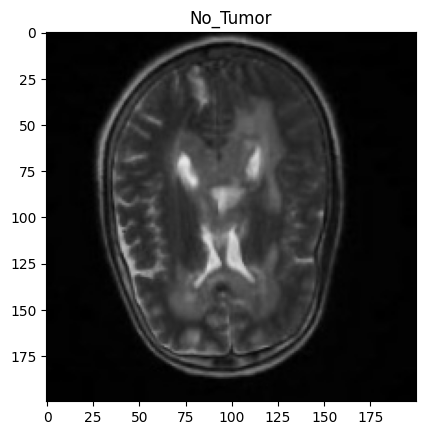

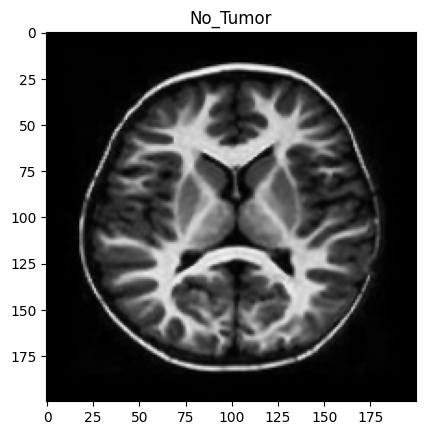

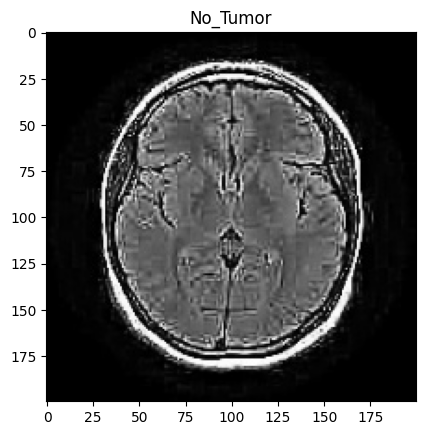

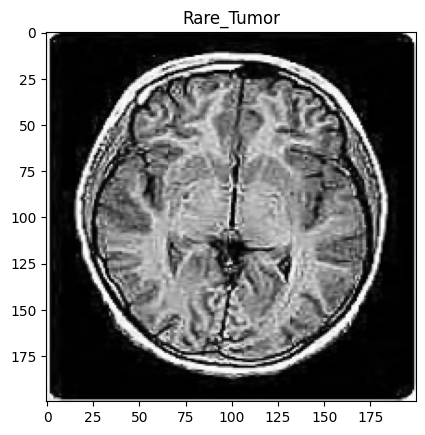

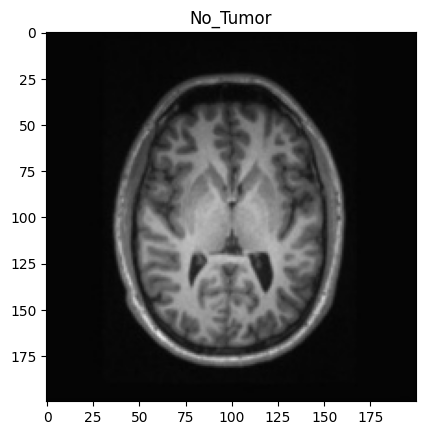

...

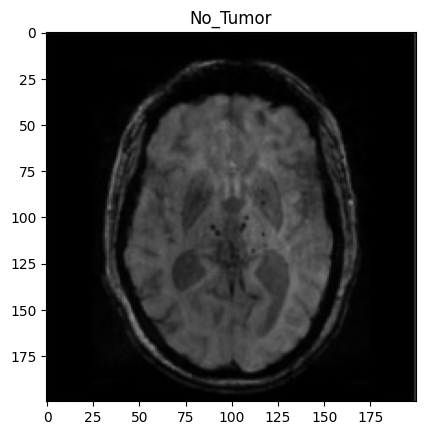

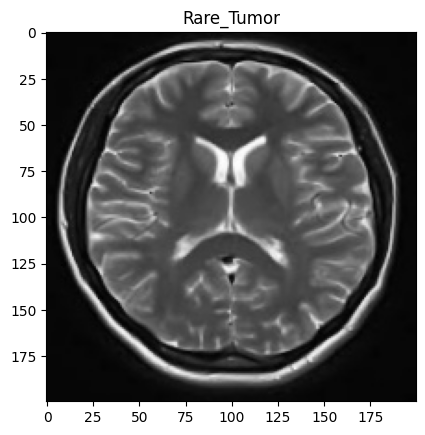

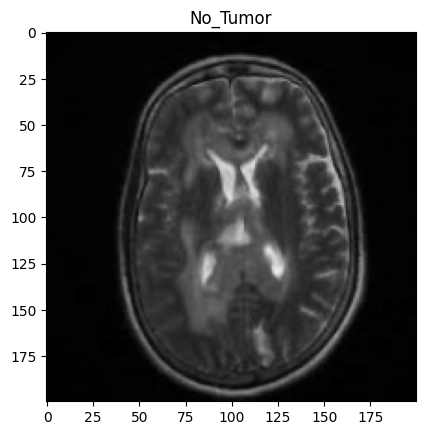

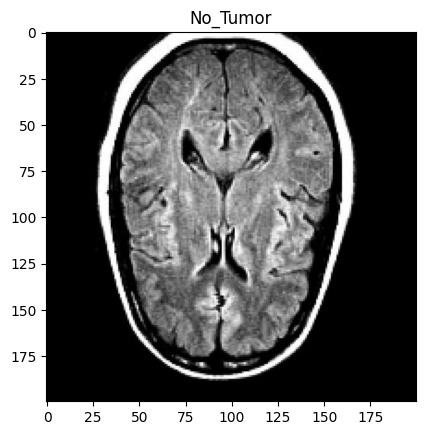

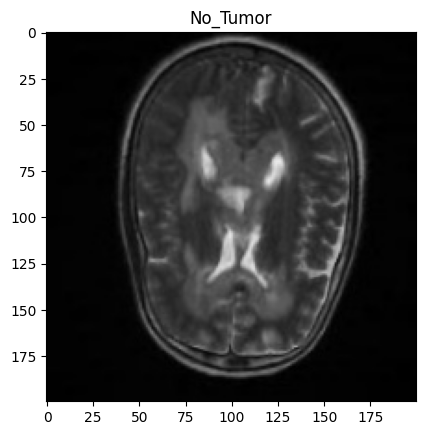

KeyboardInterrupt: 

In [16]:
import matplotlib.pyplot as plt


# Function to display images and labels
def display_images_with_labels(dataset):
    for image, label in dataset:
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(label)
        plt.show()


# Display the new dataset
display_images_with_labels(new_dataset)


In [23]:
from sklearn.model_selection import train_test_split


# Assuming you have a list of image paths and corresponding labels in your new_dataset
image_paths, labels = zip(*new_dataset)


# Split the data into training and testing sets
train_images, test_images, train_labels, test_labels = train_test_split(
    image_paths, labels, test_size=0.2, random_state=42
)


In [33]:
import cv2
import os
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Replace '/path/to/rarecases1' with the actual path to your rare cases dataset
rarecases1_path = '/kaggle/working/preprocessed_images/rare_cases1'

# List all files in the directory
rarecases1_files = [os.path.join(rarecases1_path, file) for file in os.listdir(rarecases1_path)]

# Assuming result contains the common indices
common_indices = set(result)

# Read images from the directory
rarecases1_images = [cv2.imread(file) for file in rarecases1_files]

# Assuming you have the indices in the "result" variable
# Creating labels for the rare cases dataset
labels = np.zeros(len(rarecases1_files), dtype=int)  # Initialize with zeros
labels[list(common_indices)] = 1  # Set labels to 1 for rare cases

# Creating a new dataset with images and corresponding labels
new_dataset = list(zip(rarecases1_images, labels))

# Assuming you have a list of image paths and corresponding labels in your new_dataset
images, labels = zip(*new_dataset)

# Split the data into training and testing sets
train_images, test_images, train_labels, test_labels = train_test_split(
    images, labels, test_size=0.2, random_state=42
)

# Define image dimensions for resizing
img_height, img_width = 128, 128

# Resize images for uniformity
train_resized_images = [cv2.resize(img, (img_height, img_width)) for img in train_images]
test_resized_images = [cv2.resize(img, (img_height, img_width)) for img in test_images]

# Convert the lists to NumPy arrays
train_resized_images = np.array(train_resized_images)
test_resized_images = np.array(test_resized_images)

# Convert labels to NumPy arrays
train_labels = np.array(train_labels)
test_labels = np.array(test_labels)

# Add this for debugging
print(f"Number of training images: {len(train_resized_images)}")
print(f"Number of testing images: {len(test_resized_images)}")
print(f"Number of training labels: {len(train_labels)}")
print(f"Number of testing labels: {len(test_labels)}")

# Define the CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Data augmentation to artificially increase the size of the training dataset
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Fit the model with data augmentation
batch_size = 32
epochs = 10
model.fit(datagen.flow(train_resized_images, train_labels, batch_size=batch_size),
          steps_per_epoch=len(train_resized_images) / batch_size, epochs=epochs)

# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(test_resized_images, test_labels, verbose=2)
print(f"\nTest accuracy: {test_acc}")



Number of training images: 1232
Number of testing images: 308
Number of training labels: 1232
Number of testing labels: 308
Epoch 1/10
38/38 [==============================] - 10s 224ms/step - loss: 265.9575 - accuracy: 0.7459
Epoch 2/10
38/38 [==============================] - 9s 228ms/step - loss: 4.5418 - accuracy: 0.7541
Epoch 3/10
38/38 [==============================] - 9s 225ms/step - loss: 2.9106 - accuracy: 0.7662
Epoch 4/10
38/38 [==============================] - 9s 226ms/step - loss: 1.7894 - accuracy: 0.7614
Epoch 5/10
38/38 [==============================] - 9s 224ms/step - loss: 1.5716 - accuracy: 0.7670
Epoch 6/10
38/38 [==============================] - 9s 232ms/step - loss: 1.5565 - accuracy: 0.7679
Epoch 7/10
38/38 [==============================] - 9s 223ms/step - loss: 1.4604 - accuracy: 0.7670
Epoch 8/10
38/38 [==============================] - 9s 223ms/step - loss: 1.1949 - accuracy: 0.7800
Epoch 9/10
38/38 [==============================] - 9s 229ms/step - loss: